## Set up Colab

In [1]:
%pip install -qU torchinfo python-dotenv

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Add src module
import sys

sys.path.insert(0, str("/content/drive/MyDrive/images_hw_2"))
print(sys.path)

['/content/drive/MyDrive/images_hw_2', '/content', '/env/python', '/usr/lib/python311.zip', '/usr/lib/python3.11', '/usr/lib/python3.11/lib-dynload', '', '/usr/local/lib/python3.11/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.11/dist-packages/IPython/extensions', '/usr/local/lib/python3.11/dist-packages/setuptools/_vendor', '/root/.ipython']


## Set up notebook

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
import os
import random
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Subset
from dotenv import load_dotenv
from IPython.display import clear_output
from torchinfo import summary
from tqdm.auto import tqdm

import wandb
from src.utils import show_images_side_by_side
from src.data_processing import CylindersProliv, CylindersTest, CylindersTrain
from src.pipeline import Pipeline, loss_function

In [6]:
# Supress torch dynamo warnings
import torch._dynamo
torch._dynamo.config.suppress_errors = True

In [7]:
# Load wandb key

# Local
# load_dotenv()

# Colab
from google.colab import userdata
WANDB_KEY = userdata.get("WANDB_KEY")

In [8]:
# Ensure deterministic behavior
from numpy.random import MT19937
from numpy.random import RandomState, SeedSequence

random.seed(3)
rs = RandomState(MT19937(SeedSequence(3)))
torch.backends.cudnn.deterministic = True
torch.manual_seed(3)
torch.cuda.manual_seed_all(3)

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

## Load data

In [9]:
# Colab
# unzip dataset
!unzip -qo "/content/drive/MyDrive/images_hw_2/data"
DATA_FOLDER = Path("/content/data")

# Local
# DATA_FOLDER = Path("./data")

In [10]:
from torchvision.transforms.v2 import Resize

IMG_SIZE = (40, 72)
transform = Resize(IMG_SIZE)

train_ds = CylindersTrain(DATA_FOLDER / "train", transform)
test_ds = CylindersTest(DATA_FOLDER / "test", transform)
val_proliv_ds = CylindersProliv(DATA_FOLDER /  "proliv", transform)

In [11]:
# Construct dataset (from train) with not anomaly images
val_not_proliv_ids = rs.choice(len(train_ds), 512, False)
val_not_proliv_ds = Subset(train_ds, val_not_proliv_ids)

train_ds = Subset(train_ds, np.delete(np.arange(len(train_ds)), val_not_proliv_ids))

In [12]:
[len(d) for d in (train_ds, val_proliv_ds, val_not_proliv_ds, test_ds)]

[9488, 154, 512, 3794]

In [13]:
# Create dataloaders
from torch.utils.data import DataLoader

BATCH_SIZE = 512

train_loader = DataLoader(train_ds, BATCH_SIZE, shuffle=True)
val_proliv_loader = DataLoader(val_proliv_ds, BATCH_SIZE, shuffle=False)
val_not_proliv_loader = DataLoader(val_not_proliv_ds, BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_ds, 1, shuffle=False)

## Linear VAE

In [ ]:
from src.linear_vae import LinearVAE

model = LinearVAE(input_shape=IMG_SIZE, latent_dim=64).to(device)
model = torch.compile(model)

optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)

### Analyze model

In [ ]:
model

OptimizedModule(
  (_orig_mod): LinearVAE(
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (enc): Encoder(
      (fc_block1): Sequential(
        (0): Linear(in_features=8640, out_features=4096, bias=False)
        (1): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Hardswish()
      )
      (fc_block2): Sequential(
        (0): Linear(in_features=4096, out_features=2048, bias=False)
        (1): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Hardswish()
        (3): Dropout(p=0.25, inplace=False)
      )
      (fc_block3): Sequential(
        (0): Linear(in_features=2048, out_features=512, bias=False)
        (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Hardswish()
      )
      (fc_block4): Sequential(
        (0): Linear(in_features=512, out_features=128, bias=False)
        (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=Tru

In [ ]:
summary(
    model,
    input_data=torch.zeros(
        size=(BATCH_SIZE, 3 * IMG_SIZE[0] * IMG_SIZE[1]), dtype=torch.float32, device=device
    ),
    mode="train",
)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [512, 8640]               --
├─LinearVAE: 1-1                         [512, 8640]               --
│    └─Flatten: 2-1                      [512, 8640]               --
│    └─Encoder: 2-2                      [512, 64]                 --
│    │    └─Sequential: 3-1              [512, 4096]               35,397,632
│    │    └─Sequential: 3-2              [512, 2048]               8,392,704
│    │    └─Sequential: 3-3              [512, 512]                1,049,600
│    │    └─Sequential: 3-4              [512, 128]                65,792
│    │    └─Linear: 3-5                  [512, 64]                 8,256
│    │    └─Linear: 3-6                  [512, 64]                 8,256
│    └─Decoder: 2-3                      [512, 8640]               --
│    │    └─Sequential: 3-7              [512, 128]                8,448
│    │    └─Sequential: 3-8              [512, 512

### Overfit model on a single batch (to validate)

In [ ]:
imgs_batch = next(iter(train_loader)).to(device)
imgs_batch.shape

torch.Size([512, 3, 40, 72])

In [ ]:
loss_hist = []

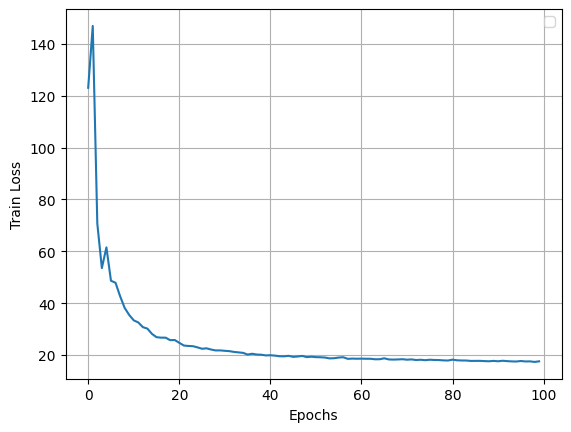

In [ ]:
N_EPOCHS = 100

for _ in tqdm(range(N_EPOCHS)):
    # Train
    model.train()
    optimizer.zero_grad()
    recon_imgs_batch, mean, log_var = model(imgs_batch)
    loss = loss_function(recon_imgs_batch, imgs_batch, mean, log_var)
    loss.backward()
    optimizer.step()

    # Save loss and plot loss plot
    loss_hist.append(loss.detach().cpu().item() / len(imgs_batch))
    clear_output(wait=True)
    plt.plot(loss_hist)
    plt.xlabel("Epochs")
    plt.ylabel("Train Loss")
    plt.legend()
    plt.grid()

    plt.show()

Model learns, so architecture, optimizer and loss are correct.

### Training

In [ ]:
# Login into wandb

# Local
# wandb.login(key=os.getenv("WANDB_KEY"))

# Colab
wandb.login(key=WANDB_KEY)

wandb: Currently logged in as: deniskirbaba (deniskirbaba-team). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
# Define train run hyperparameters
config = dict(
    img_size=IMG_SIZE,
    vae_type="linear",
    latent_dim=64,
    epochs=100,
    batch_size=BATCH_SIZE,
    learning_rate=4e-3,
)

In [ ]:
model = LinearVAE(
    input_shape=config["img_size"], latent_dim=config["latent_dim"]
).to(device)
model = torch.compile(model)

optimizer = torch.optim.Adam(model.parameters(), lr=config["learning_rate"])
pipeline = Pipeline(device, "images-hw2")

In [ ]:
model = pipeline.train(config, model, optimizer, train_loader, val_proliv_loader, val_not_proliv_loader, Path("./models"))

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇███
train loss (batch),█▆▃▃▂▂▁▁▁▂▂▁▂▄▂▁▂▁▁▁▁▁▁▁▁▁▁▂▂▂▂▁▁▁▁▂▁▁▂▁
train loss (epoch),▆▇▅▅▃▂▂▂▅▇▄▄▄▄█▃▂▂▂▃▅▄▃▃▂▂▁▁▂▂▂▂▄▂▂▂▁▁▁▂
val not proliv loss (epoch),▄▁▁▁▁▁█▄▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁
val proliv loss (epoch),▁▁▁▁▁█▁▃▃▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,99
train loss (batch),24.19243
train loss (epoch),20.37545
val not proliv loss (epoch),17.3884
val proliv loss (epoch),48.70388


### Testing

In [ ]:
# Calculate metrics
# model = torch.load("./models/linear_64_100_last.pt", map_location=device, weights_only=True)

# Calculate threshold, based on val loss on proliv and not proliv
mean_proliv_val_loss = 48.7
mean_not_proliv_val_loss = 17.4
threshold = (mean_proliv_val_loss + mean_not_proliv_val_loss) / 2
config['loss_threshold'] = threshold  # Update hyperparameters

tpr, tnr = pipeline.test(config, model, test_loader)

Test:   0%|          | 0/3794 [00:00<?, ?it/s]

TNR,▁
TPR,▁
TNR,0.74625
TPR,0.95349


### Generation examples

In [ ]:
# model = torch.load("./models/linear_64_100_99.pt", map_location=device, weights_only=True)  # Load best model
latent_dim = 64
batch_size = 2

#### From noise vector

In [ ]:
model.eval()
with torch.no_grad():
    noise = torch.randn(batch_size, latent_dim).to(device)
    generated_images = model.dec(noise).reshape(batch_size, 3, *IMG_SIZE).cpu()

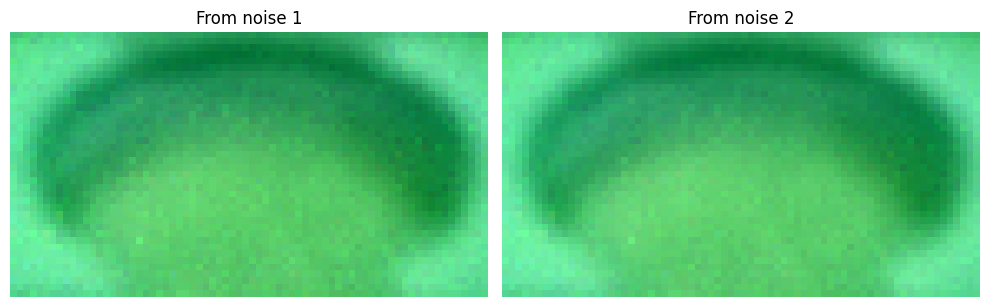

In [ ]:
show_images_side_by_side(generated_images[0], generated_images[1], ["From noise 1", "From noise 2"])

#### From non-anomaly image

In [ ]:
generated_images = []
model.eval()
with torch.no_grad():
    for image in [val_not_proliv_ds[0], val_not_proliv_ds[1]]:
        recon_image, _, _ = model(image.to(device))
        generated_images.append(recon_image.cpu())

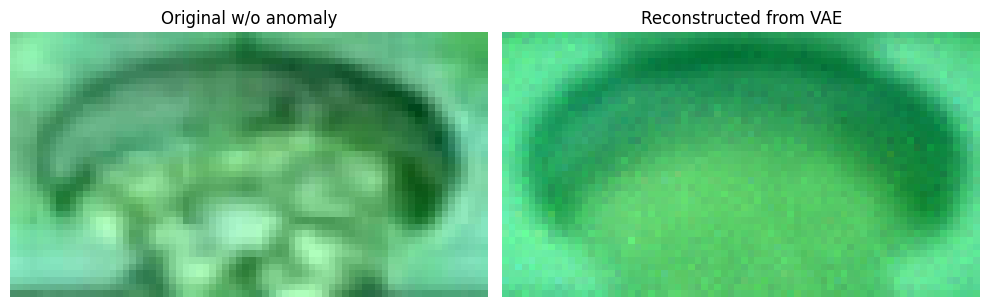

In [ ]:
show_images_side_by_side(val_not_proliv_ds[0], generated_images[0], ["Original w/o anomaly", "Reconstructed from VAE"])

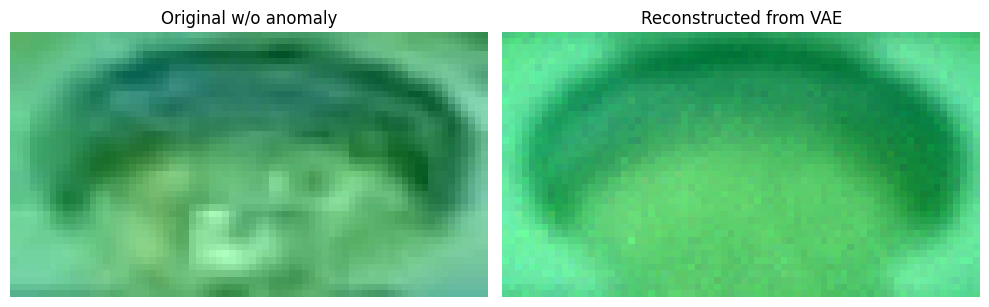

In [ ]:
show_images_side_by_side(val_not_proliv_ds[1], generated_images[1], ["Original w/o anomaly", "Reconstructed from VAE"])

#### From anomaly image

In [ ]:
generated_images = []
model.eval()
with torch.no_grad():
    for image in [val_proliv_ds[0], val_proliv_ds[1]]:
        recon_image, _, _ = model(image.to(device))
        generated_images.append(recon_image.cpu())

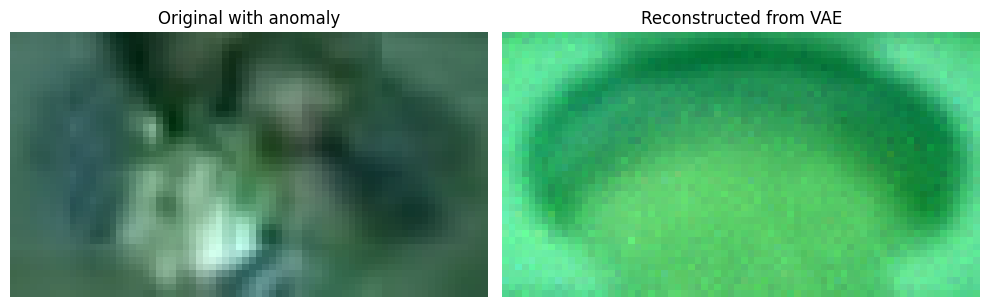

In [ ]:
show_images_side_by_side(val_proliv_ds[0], generated_images[0], ["Original with anomaly", "Reconstructed from VAE"])

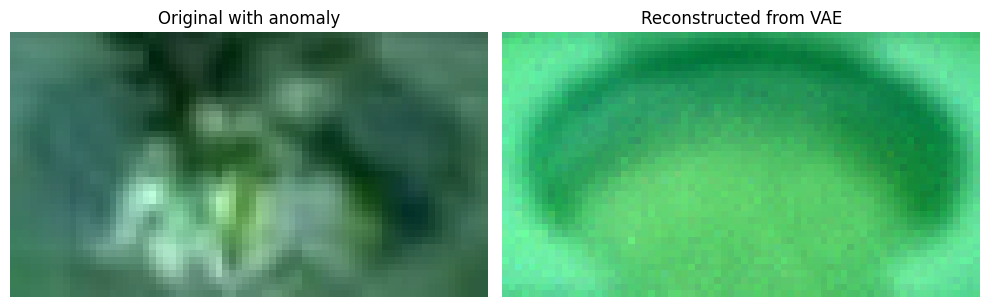

In [ ]:
show_images_side_by_side(val_proliv_ds[1], generated_images[1], ["Original with anomaly", "Reconstructed from VAE"])

## Small Conv VAE

In [ ]:
from src.small_conv_vae import SmallConvVAE

model = SmallConvVAE(input_shape=IMG_SIZE, latent_dim=128).to(device)
model = torch.compile(model)

optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)

### Analyze model

In [ ]:
model

OptimizedModule(
  (_orig_mod): SmallConvVAE(
    (encoder): ConvEncoder(
      (encoder): Sequential(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): Hardswish()
        (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): Hardswish()
        (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (9): Hardswish()
        (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (11): Flatten(start_dim=1, end_dim=-1)
      )
      (fc_mean): Linear(in_features=5760, out_features=128, bias=True)
      (

In [ ]:
summary(
    model,
    input_data=torch.zeros(
        size=(BATCH_SIZE, 3, *IMG_SIZE), dtype=torch.float32, device=device
    ),
    mode="train",
)

Layer (type:depth-idx)                        Output Shape              Param #
OptimizedModule                               [512, 3, 40, 72]          --
├─SmallConvVAE: 1-1                           [512, 3, 40, 72]          --
│    └─ConvEncoder: 2-1                       [512, 128]                --
│    │    └─Sequential: 3-1                   [512, 5760]               93,632
│    │    └─Linear: 3-2                       [512, 128]                737,408
│    │    └─Linear: 3-3                       [512, 128]                737,408
│    └─ConvDecoder: 2-2                       [512, 3, 40, 72]          --
│    │    └─Linear: 3-4                       [512, 5760]               743,040
│    │    └─Sequential: 3-5                   [512, 3, 40, 72]          41,635
Total params: 2,353,123
Trainable params: 2,353,123
Non-trainable params: 0
Total mult-adds (Units.GIGABYTES): 22.71
Input size (MB): 17.69
Forward/backward pass size (MB): 1286.86
Params size (MB): 9.41
Estimated Total Si

### Overfit model on a single batch (to validate)

In [ ]:
imgs_batch = next(iter(train_loader)).to(device)
imgs_batch.shape

torch.Size([512, 3, 40, 72])

In [ ]:
loss_hist = []

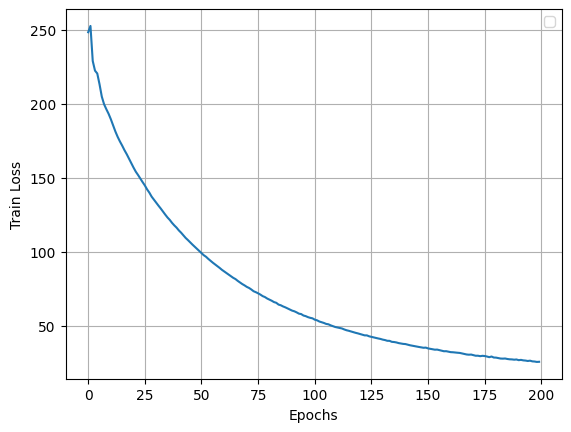

In [ ]:
N_EPOCHS = 100

for _ in tqdm(range(N_EPOCHS)):
    # Train
    model.train()
    optimizer.zero_grad()
    recon_imgs_batch, mean, log_var = model(imgs_batch)

    loss = loss_function(recon_imgs_batch, imgs_batch, mean, log_var)
    loss.backward()
    optimizer.step()

    # Save loss and plot loss plot
    loss_hist.append(loss.detach().cpu().item() / len(imgs_batch))
    clear_output(wait=True)
    plt.plot(loss_hist)
    plt.xlabel("Epochs")
    plt.ylabel("Train Loss")
    plt.legend()
    plt.grid()

    plt.show()

Model learns, so architecture, optimizer and loss are correct.

### Training

In [ ]:
# Login into wandb

# Local
# wandb.login(key=os.getenv("WANDB_KEY"))

# Colab
wandb.login(key=WANDB_KEY)

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
# Define train run hyperparameters
config = dict(
    img_size=IMG_SIZE,
    vae_type="conv_small",
    latent_dim=128,
    epochs=100,
    batch_size=BATCH_SIZE,
    learning_rate=4e-3,
)

In [ ]:
model = SmallConvVAE(
    input_shape=config["img_size"], latent_dim=config["latent_dim"]
).to(device)
model = torch.compile(model)

optimizer = torch.optim.Adam(model.parameters(), lr=config["learning_rate"])
pipeline = Pipeline(device, "images-hw2")

In [ ]:
model = pipeline.train(config, model, optimizer, train_loader, val_proliv_loader, val_not_proliv_loader, Path("./models"))

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/19 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇████
train loss (batch),█▂▂▁▁▄▄▃▁▁▁▁▁▁▁▁▁▂▃▁▁▁▂▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train loss (epoch),█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val not proliv loss (epoch),█▃▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val proliv loss (epoch),█▃▂▂▃▁▃▃▂▁▁▁▁▁▁▂▂▂▁▁▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,99
train loss (batch),9.61349
train loss (epoch),9.83327
val not proliv loss (epoch),9.559
val proliv loss (epoch),45.26241


### Testing

In [ ]:
# Calculate metrics
# model = torch.load("???.pt", map_location=device, weights_only=True)

# Calculate threshold, based on val loss on proliv and not proliv
mean_proliv_val_loss = 45.26
mean_not_proliv_val_loss = 9.56
threshold = (mean_proliv_val_loss + mean_not_proliv_val_loss) / 2
config['loss_threshold'] = threshold  # Update hyperparameters

tpr, tnr = pipeline.test(config, model, test_loader)

Test:   0%|          | 0/3794 [00:00<?, ?it/s]

TNR,▁
TPR,▁
TNR,0.83683
TPR,0.81395


### Generation examples

In [ ]:
# model = torch.load("???.pt", map_location=device, weights_only=True)  # Load best model
latent_dim = 128
batch_size = 2

#### From noise vector

In [ ]:
model.eval()
with torch.no_grad():
    noise = torch.randn(batch_size, latent_dim).to(device)
    generated_images = model.decoder(noise).cpu()

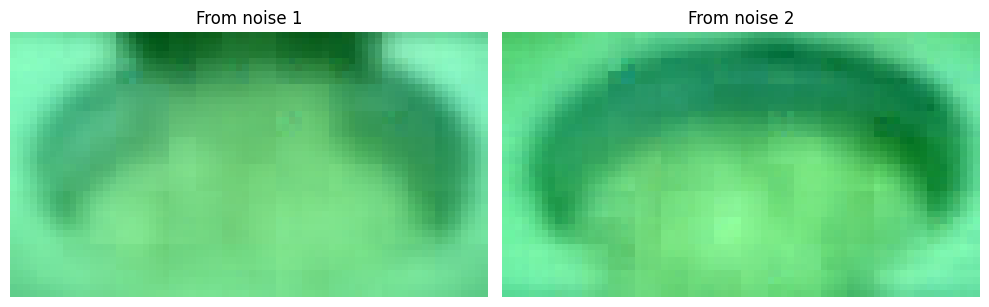

In [ ]:
show_images_side_by_side(generated_images[0], generated_images[1], ["From noise 1", "From noise 2"])

#### From non-anomaly image

In [ ]:
generated_images = []
model.eval()
with torch.no_grad():
    for image in [val_not_proliv_ds[0], val_not_proliv_ds[1]]:
        recon_image, _, _ = model(image.to(device)[None, :])
        generated_images.append(recon_image.cpu())

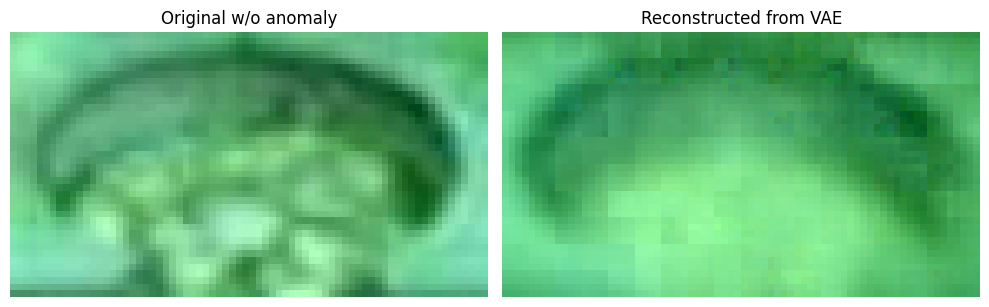

In [ ]:
show_images_side_by_side(val_not_proliv_ds[0], generated_images[0][0], ["Original w/o anomaly", "Reconstructed from VAE"])

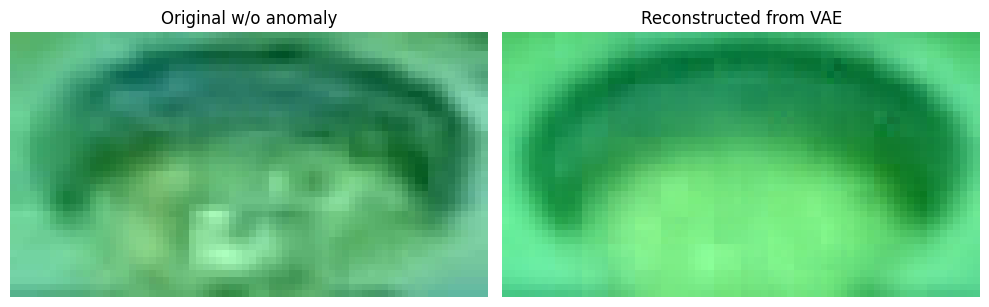

In [ ]:
show_images_side_by_side(val_not_proliv_ds[1], generated_images[1][0], ["Original w/o anomaly", "Reconstructed from VAE"])

#### From anomaly image

In [ ]:
generated_images = []
model.eval()
with torch.no_grad():
    for image in [val_proliv_ds[0], val_proliv_ds[1]]:
        recon_image, _, _ = model(image.to(device)[None, :])
        generated_images.append(recon_image.cpu())

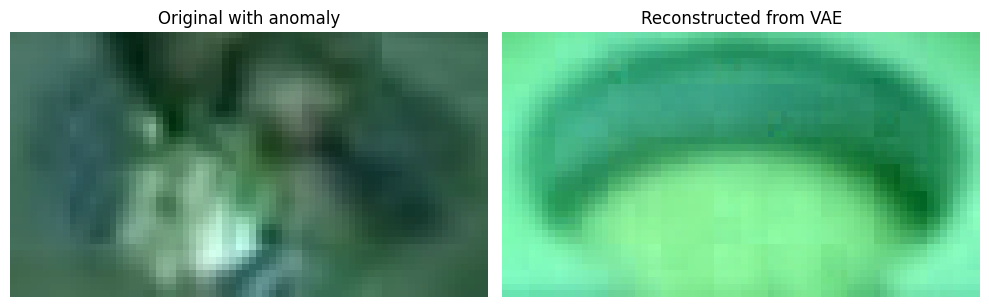

In [ ]:
show_images_side_by_side(val_proliv_ds[0], generated_images[0][0], ["Original with anomaly", "Reconstructed from VAE"])

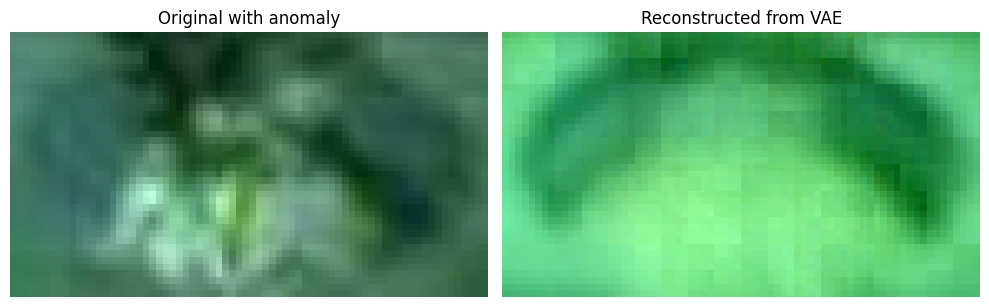

In [ ]:
show_images_side_by_side(val_proliv_ds[1], generated_images[1][0], ["Original with anomaly", "Reconstructed from VAE"])

## Big Conv VAE

In [14]:
from src.big_conv_vae import BigConvVAE

model = BigConvVAE(input_shape=IMG_SIZE, latent_dim=128).to(device)
model = torch.compile(model)

optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)

### Analyze model

In [15]:
model

OptimizedModule(
  (_orig_mod): BigConvVAE(
    (encoder): ConvEncoder(
      (encoder): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): Hardswish()
        (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): Hardswish()
        (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (9): Hardswish()
        (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (11): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (12): BatchNorm2d(512, eps=1e-05, momentum

In [ ]:
summary(
    model,
    input_data=torch.zeros(
        size=(BATCH_SIZE, 3, *IMG_SIZE), dtype=torch.float32, device=device
    ),
    mode="train",
)

Layer (type:depth-idx)                        Output Shape              Param #
OptimizedModule                               [512, 3, 40, 72]          --
├─BigConvVAE: 1-1                             [512, 3, 40, 72]          --
│    └─ConvEncoder: 2-1                       [512, 128]                --
│    │    └─Sequential: 3-1                   [512, 23040]              1,552,768
│    │    └─Linear: 3-2                       [512, 128]                2,949,248
│    │    └─Linear: 3-3                       [512, 128]                2,949,248
│    └─ConvDecoder: 2-2                       [512, 3, 40, 72]          --
│    │    └─Linear: 3-4                       [512, 23040]              2,972,160
│    │    └─Sequential: 3-5                   [512, 3, 40, 72]          1,345,603
Total params: 11,769,027
Trainable params: 11,769,027
Non-trainable params: 0
Total mult-adds (Units.GIGABYTES): 141.32
Input size (MB): 17.69
Forward/backward pass size (MB): 2867.59
Params size (MB): 47.08
Es

### Overfit model on a single batch (to validate)

In [16]:
imgs_batch = next(iter(train_loader)).to(device)
imgs_batch.shape

torch.Size([512, 3, 40, 72])

In [17]:
loss_hist = []

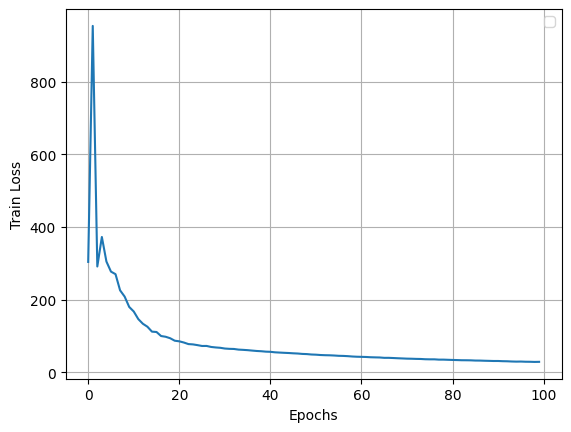

In [18]:
N_EPOCHS = 100

for _ in tqdm(range(N_EPOCHS)):
    # Train
    model.train()
    optimizer.zero_grad()
    recon_imgs_batch, mean, log_var = model(imgs_batch)

    loss = loss_function(recon_imgs_batch, imgs_batch, mean, log_var)
    loss.backward()
    optimizer.step()

    # Save loss and plot loss plot
    loss_hist.append(loss.detach().cpu().item() / len(imgs_batch))
    clear_output(wait=True)
    plt.plot(loss_hist)
    plt.xlabel("Epochs")
    plt.ylabel("Train Loss")
    plt.legend()
    plt.grid()

    plt.show()

Model learns, so architecture, optimizer and loss are correct.

### Training

In [19]:
# Login into wandb

# Local
# wandb.login(key=os.getenv("WANDB_KEY"))

# Colab
wandb.login(key=WANDB_KEY)

wandb: Currently logged in as: deniskirbaba (deniskirbaba-team). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [31]:
# Define train run hyperparameters
config = dict(
    img_size=IMG_SIZE,
    vae_type="conv_big",
    latent_dim=128,
    epochs=250,
    batch_size=BATCH_SIZE,
    learning_rate=3e-4,
)

In [32]:
model = BigConvVAE(
    input_shape=config["img_size"], latent_dim=config["latent_dim"]
).to(device)
model = torch.compile(model)

optimizer = torch.optim.Adam(model.parameters(), lr=config["learning_rate"])
pipeline = Pipeline(device, "images-hw2")

In [33]:
model = pipeline.train(config, model, optimizer, train_loader, val_proliv_loader, val_not_proliv_loader, Path("./models"))

Epochs:   0%|          | 0/250 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Training:   0%|          | 0/18 [00:00<?, ?it/s]

Validation (proliv):   0%|          | 0/1 [00:00<?, ?it/s]

Validation (not proliv):   0%|          | 0/1 [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇██
train loss (batch),█▂▄▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train loss (epoch),█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val not proliv loss (epoch),█▆▇▃▃▃▃▃▂▂▂▂▂▂▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val proliv loss (epoch),▇█▃▃▂▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,249
train loss (batch),8.97154
train loss (epoch),8.91061
val not proliv loss (epoch),8.74182
val proliv loss (epoch),44.64442


### Testing

In [34]:
# Calculate metrics
# model = torch.load("???.pt", map_location=device, weights_only=True)

# Calculate threshold, based on val loss on proliv and not proliv
mean_proliv_val_loss = 44.64
mean_not_proliv_val_loss = 8.74
threshold = (mean_proliv_val_loss + mean_not_proliv_val_loss) / 2
config['loss_threshold'] = threshold  # Update hyperparameters

tpr, tnr = pipeline.test(config, model, test_loader)

Test:   0%|          | 0/3794 [00:00<?, ?it/s]

TNR,▁
TPR,▁
TNR,0.84065
TPR,0.7907


### Generation examples

In [35]:
# model = torch.load("???.pt", map_location=device, weights_only=True)  # Load best model
latent_dim = 128
batch_size = 2

#### From noise vector

In [36]:
model.eval()
with torch.no_grad():
    noise = torch.randn(batch_size, latent_dim).to(device)
    generated_images = model.decoder(noise).cpu()

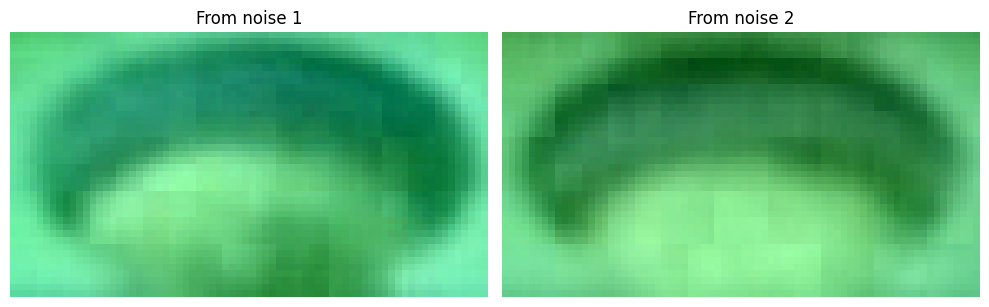

In [37]:
show_images_side_by_side(generated_images[0], generated_images[1], ["From noise 1", "From noise 2"])

#### From non-anomaly image

In [16]:
generated_images = []
model.eval()
with torch.no_grad():
    for image in [val_not_proliv_ds[0], val_not_proliv_ds[1]]:
        recon_image, _, _ = model(image.to(device)[None, :])
        generated_images.append(recon_image.cpu())

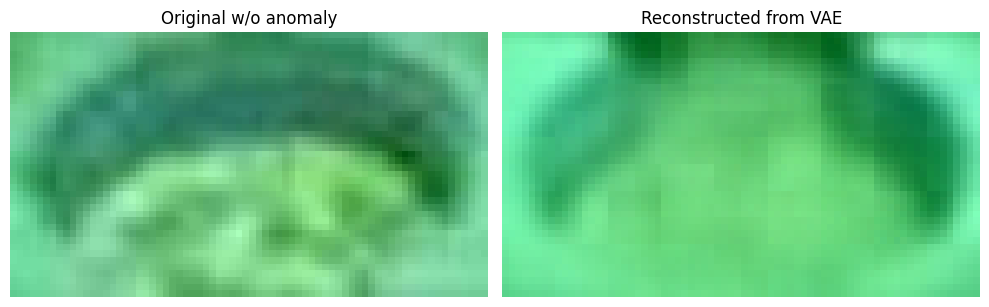

In [17]:
show_images_side_by_side(val_not_proliv_ds[0], generated_images[0][0], ["Original w/o anomaly", "Reconstructed from VAE"])

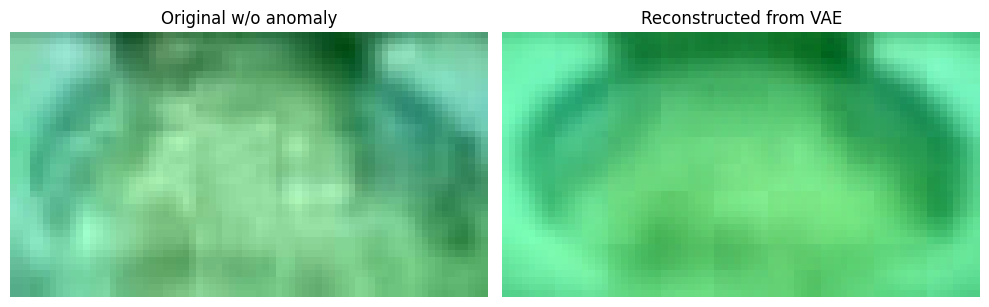

In [18]:
show_images_side_by_side(val_not_proliv_ds[1], generated_images[1][0], ["Original w/o anomaly", "Reconstructed from VAE"])

#### From anomaly image

In [19]:
generated_images = []
model.eval()
with torch.no_grad():
    for image in [val_proliv_ds[0], val_proliv_ds[1]]:
        recon_image, _, _ = model(image.to(device)[None, :])
        generated_images.append(recon_image.cpu())

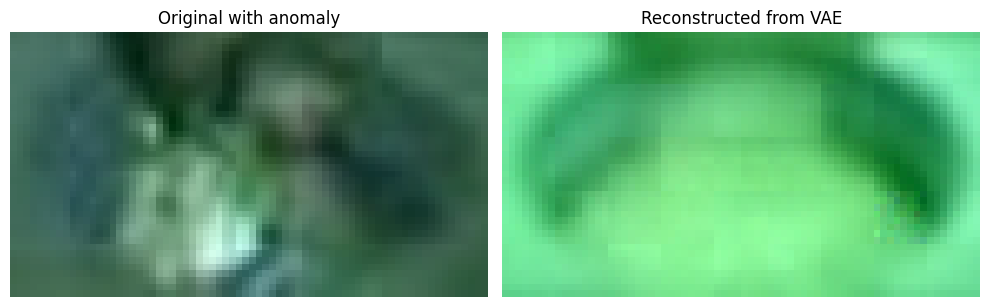

In [20]:
show_images_side_by_side(val_proliv_ds[0], generated_images[0][0], ["Original with anomaly", "Reconstructed from VAE"])

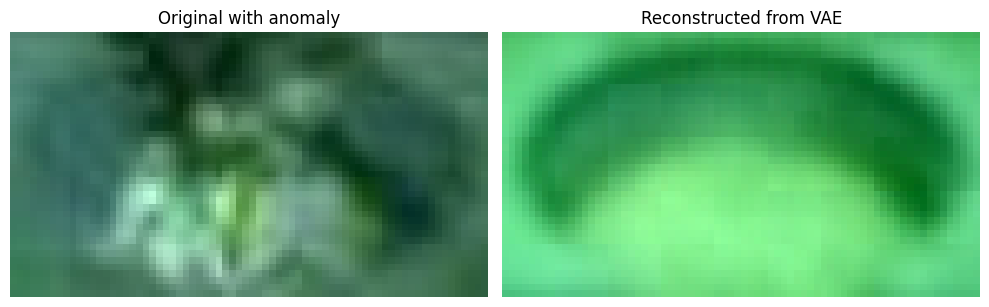

In [21]:
show_images_side_by_side(val_proliv_ds[1], generated_images[1][0], ["Original with anomaly", "Reconstructed from VAE"])